In [1]:
# Install core dependencies
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install hydra-core iopath pycocotools opencv-python matplotlib Pillow huggingface_hub
!pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install --quiet --upgrade torch==2.0.1+cu118 torchvision==0.15.2+cu118 torchaudio==2.0.2+cu118 \
    -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 15.2 MB/s eta 0:00:00
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31527 sha256=45f7c7d69359fd8ff572a5ef51c986542bf81a37f915eadd4f40818a51e8c31e
  Stored in directory: /root/.cache/pip/wheels/7c/96/04/4f5f31ff812f684f69f40cb1634357812220aac58d4698048c
Successfully built iopath
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-0_qdmjj6
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-0_qdmjj6
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.9 MB/s eta 0:0

In [2]:
# Clone SAM2 Repository
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2

Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 36.61 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2


Model checkpoint (.pt)

 https://huggingface.co/facebook/sam2-hiera-tiny/resolve/main/sam2_hiera_tiny.pt

In [5]:
from google.colab import files
uploaded = files.upload()  # sam2_hiera_tiny.pt and sam2_hiera_t.yaml


Saving sam2_hiera_tiny.pt to sam2_hiera_tiny (1).pt


Dataset link:

http://www.cs.cmu.edu/~ehsiao/3drecognition/CMU10_3D.zip


In [6]:
from google.colab import files
uploaded = files.upload()  # choose data_2D.zip here

Saving data_2D.zip to data_2D.zip


In [7]:
# Import Libraries

import os
import glob
import shutil
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image


In [8]:
# Clone & Install SAM2 Locally

!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2
!pip install -e .
%cd /content


Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 32.35 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2/segment-anything-2
Obtaining file:///content/segment-anything-2/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Using cached iopath-0.1.10-py3-none-any.whl
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for SAM-2: filename=sam_2-1.0-0.editable-cp312-cp312-linux_x86_64.whl size=13863 sha256=2a74f98cb9bab2dd3a2db2c488289750b88c2b57a3fde8f70afb308f716f23f3
  Stored in directory: /tmp/pip-ephem-wheel-cache-9mvggnql/wheels/cf/67/cd/7bc24384c0ee1193fc96e724f9a773162e0b4cded2b125d297
Successfully built SA

In [9]:
# Import SAM2 Components

# Add repo to python path manually
import sys
sys.path.append('/content/segment-anything-2')

# Try import again
from sam2.build_sam import build_sam2, build_sam2_video_predictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.sam2_image_predictor import SAM2ImagePredictor

print("SAM2 Import Successful ✅")

SAM2 Import Successful ✅


In [10]:
# Define Tracking Function

def track_item_boxes(imgpath1, imgpath2, img1boxclasslist, visualize=True):
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)
    shutil.copy(imgpath1, tempfolder + "/00000.jpg")
    shutil.copy(imgpath2, tempfolder + "/00001.jpg")

    inference_state = predictor_vid.init_state(video_path="./tempdir")
    predictor_vid.reset_state(inference_state)

    ann_frame_idx = 0
    for img1boxclass in img1boxclasslist:
        ([xmin, xmax, ymin, ymax], objectnumint) = img1boxclass
        box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor_vid.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=objectnumint,
            box=box,
        )

    video_segments = {}

    for out_frame_idx, out_obj_ids, out_mask_logits in predictor_vid.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

    if visualize:
        fig, ax = plt.subplots()
        plt.title("Original Image")
        ax.imshow(Image.open(tempfolder + "/00000.jpg"))
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.show()

        out_frame_idx = 1
        plt.figure(figsize=(6, 4))
        plt.title(f"detected object in test image ::")
        plt.imshow(Image.open(tempfolder + "/00001.jpg"))
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

    return video_segments


In [11]:
!unzip -q /content/CMU10_3D.zip

In [12]:
!ls

CMU10_3D  CMU10_3D.zip	sample_data  segment-anything-2


In [13]:
# Search entire extracted dataset for data_2D folder
import os

for root, dirs, files in os.walk("/content"):
    if "data_2D" in dirs:
        print("Found path:- ", os.path.join(root, "data_2D"))

Found path:-  /content/CMU10_3D/data_2D


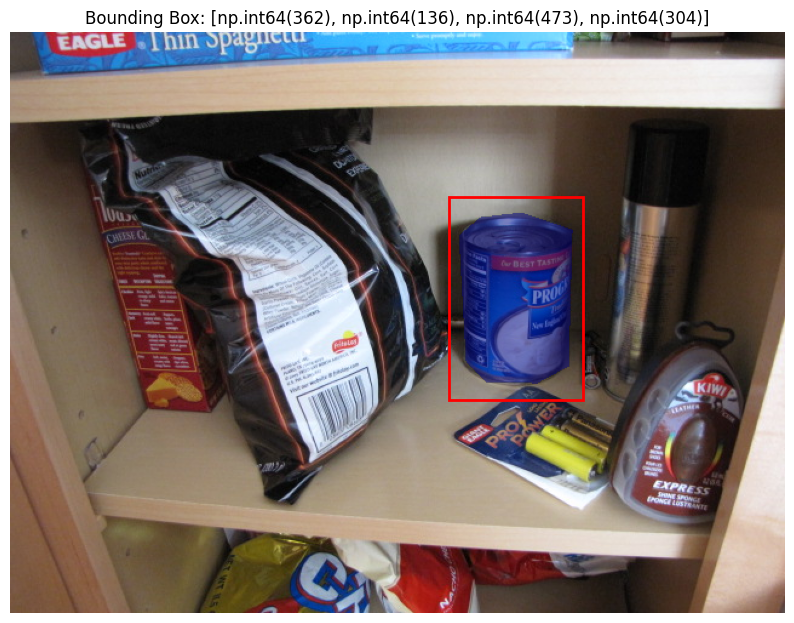

Bounding box: [np.int64(362), np.int64(136), np.int64(473), np.int64(304)]


In [14]:
# Process Image & Mask

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def process_img_mask_pair(img_path, mask_path, visualize=True):
    """Simplified version to get bounding box from image-mask pair"""
    # Load and process images
    image = np.array(Image.open(img_path))
    mask = np.array(Image.open(mask_path)) > 128  # Convert to binary mask

    # Get bounding box with padding
    y, x = np.where(mask)
    if not x.size:  # If mask is empty
        bbox = [0, 0, *image.shape[:2][::-1]]  # [xmin, ymin, width, height]
    else:
        padding = 0.1  # 10% padding
        xmin, xmax = x.min(), x.max()
        ymin, ymax = y.min(), y.max()
        pad_x = int((xmax - xmin) * padding)
        pad_y = int((ymax - ymin) * padding)
        bbox = [
            max(0, xmin - pad_x),
            max(0, ymin - pad_y),
            min(image.shape[1], xmax + pad_x),
            min(image.shape[0], ymax + pad_y)
        ]

    # Visualization
    if visualize:
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.imshow(np.ma.masked_where(~mask, mask), alpha=0.5, cmap='jet')
        plt.gca().add_patch(plt.Rectangle(
            (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
            linewidth=2, edgecolor='r', facecolor='none'
        ))
        plt.title(f"Bounding Box: {bbox}")
        plt.axis('off')
        plt.show()

    return bbox

# Usage remains the same
# bbox = process_img_mask_pair(
#     "/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001.jpg",
#     "/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001_1_gt.png"
# )
bbox = process_img_mask_pair(
    "/content/CMU10_3D/data_2D/can_chowder_000001.jpg",
    "/content/CMU10_3D/data_2D/can_chowder_000001_1_gt.png"
)

print("Bounding box:", bbox)


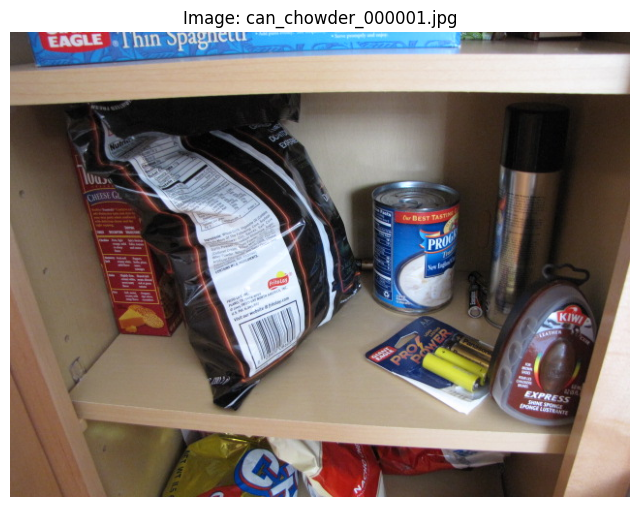

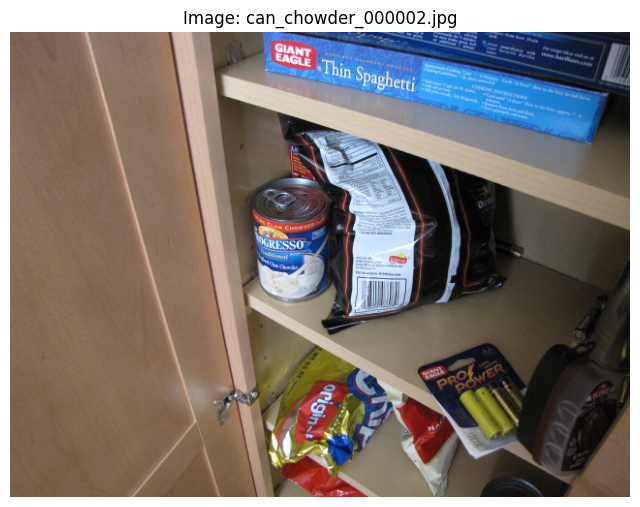

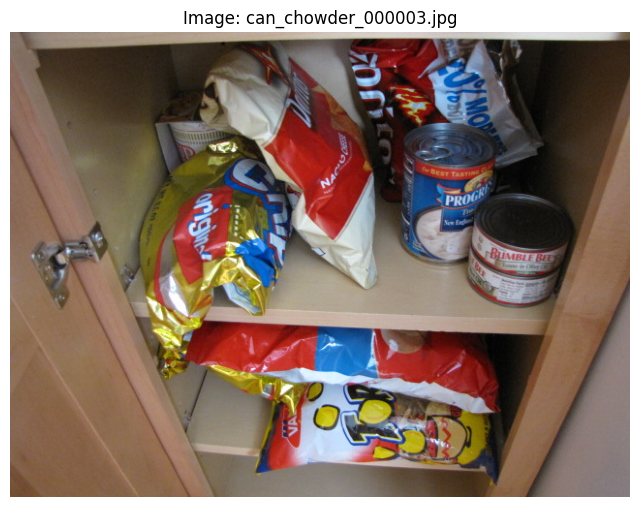

In [15]:
# Display & Check Multiple Images

import matplotlib.pyplot as plt
from PIL import Image

# Your paths
# imgpaths = [
#     '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000001.jpg',
#     '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000002.jpg',
#     '/content/CMU10_3D (1)/CMU10_3D/data_2D/can_chowder_000003.jpg'
# ]
imgpaths = [
    '/content/CMU10_3D/data_2D/can_chowder_000001.jpg',
    '/content/CMU10_3D/data_2D/can_chowder_000002.jpg',
    '/content/CMU10_3D/data_2D/can_chowder_000003.jpg'
]


# Display each image
for path in imgpaths:
    img = Image.open(path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f'Image: {path.split("/")[-1]}')  # Extracts filename
    plt.axis('off')
    plt.show()

In [16]:
# Verify Dataset Paths
import os
# input_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'  # Your images and masks
# output_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'  # Same as input_dir

input_dir = '/content/CMU10_3D/data_2D'
output_dir = '/content/CMU10_3D/data_2D'

# Verify files exist
print("Sample files in directory:")
print(os.listdir(input_dir)[:5])


Sample files in directory:
['carton_soymilk_000006_1_gt.png', 'diet_coke_000013_1_gt.png', 'diet_coke_000034.jpg', 'hc_potroastsoup_000021.jpg', 'can_tomatosoup_000021_1_gt.png']


In [17]:
# Import SAM2 Libraries

import torch
from sam2.build_sam import build_sam2
from sam2.build_sam import build_sam2_video_predictor
import os, glob, shutil
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


In [18]:

# === Model paths ===
model_cfg_name = "sam2_hiera_t"  # Hydra wants config name, not full path
checkpoint = "/content/segment-anything-2/sam2_hiera_tiny.pt"


# === Temp folder ===
tempfolder = "./tempdir"
os.makedirs(tempfolder, exist_ok=True)

# === Device ===
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# === Load model ===
sam2 = build_sam2(model_cfg_name, checkpoint, device=device, apply_postprocessing=False)
predictor_prompt = SAM2ImagePredictor(sam2)
mask_generator = SAM2AutomaticMaskGenerator(sam2)
predictor_vid = build_sam2_video_predictor(model_cfg_name, checkpoint, device=device)

print("✅ Model loaded successfully!")

Using device: cuda
✅ Model loaded successfully!


In [19]:
# Temporary directory setup

tempfolder = "./tempdir"
def create_if_not_exists(dirname):
    if not os.path.exists(dirname):
        os.mkdir(dirname)
def cleardir(tempfolder):
    filepaths = glob.glob(tempfolder+"/*")
    for filepath in filepaths:
        os.unlink(filepath)

In [20]:
object_types = [
    'can_chowder', 'can_soymilk', 'can_tomatosoup',
    'carton_oj', 'carton_soymilk', 'diet_coke',
    'hc_potroastsoup', 'juicebox', 'rice_tuscan', 'ricepilaf'
]

In [21]:
import cv2

input_dir = '/content/CMU10_3D/data_2D'
results = []

for obj in object_types:
    print(f"\n🔍 Processing {obj}...")

    # Reference image & mask
    ref_img = f"{input_dir}/{obj}_000001.jpg"
    ref_mask = f"{input_dir}/{obj}_000001_1_gt.png"

    # Get bounding box from mask
    mask = np.array(Image.open(ref_mask))
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])
    ref_box = [x, x+w, y, y+h]

    # Find all other images
    all_images = [
        f for f in os.listdir(input_dir)
        if f.startswith(obj) and f.endswith('.jpg') and not f.endswith('_000001.jpg')
    ]

    for img_file in all_images:
        target_img = f"{input_dir}/{img_file}"

        video_segments = track_item_boxes(
            imgpath1=ref_img,
            imgpath2=target_img,
            img1boxclasslist=[(ref_box, 1)],
            visualize=False
        )

        pred_mask = video_segments[1][1]

        results.append({
            'object': obj,
            'image': img_file,
            'pred_mask': pred_mask,
            'ref_box': ref_box
        })

    print(f"✅ Processed {len(all_images)} images for {obj}")



🔍 Processing can_chowder...


frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 19.34it/s]
/content/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(
propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.16it/s]


✅ Processed 49 images for can_chowder

🔍 Processing can_soymilk...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 10.01it/s]


✅ Processed 49 images for can_soymilk

🔍 Processing can_tomatosoup...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


✅ Processed 49 images for can_tomatosoup

🔍 Processing carton_oj...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.82it/s]


✅ Processed 49 images for carton_oj

🔍 Processing carton_soymilk...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.84it/s]


✅ Processed 49 images for carton_soymilk

🔍 Processing diet_coke...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.67it/s]


✅ Processed 49 images for diet_coke

🔍 Processing hc_potroastsoup...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.50it/s]


✅ Processed 49 images for hc_potroastsoup

🔍 Processing juicebox...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.56it/s]


✅ Processed 49 images for juicebox

🔍 Processing rice_tuscan...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.62it/s]


✅ Processed 49 images for rice_tuscan

🔍 Processing ricepilaf...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.52it/s]

✅ Processed 49 images for ricepilaf


Reference image exists: True
Reference mask exists: True
Target image exists: True

Running detection...


propagate in video: 100%|██████████| 2/2 [00:00<00:00,  9.80it/s]


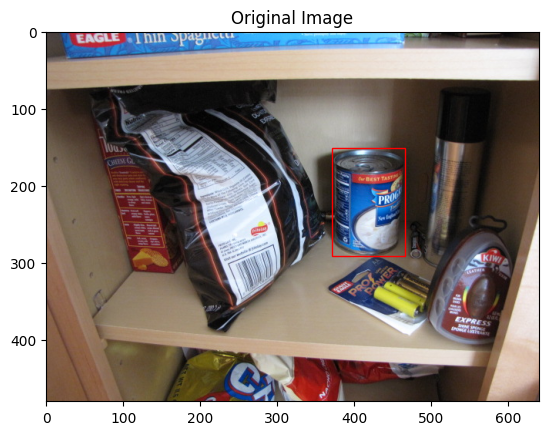

✅ Detection successful!


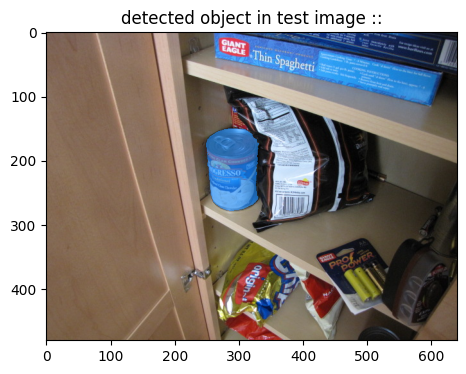

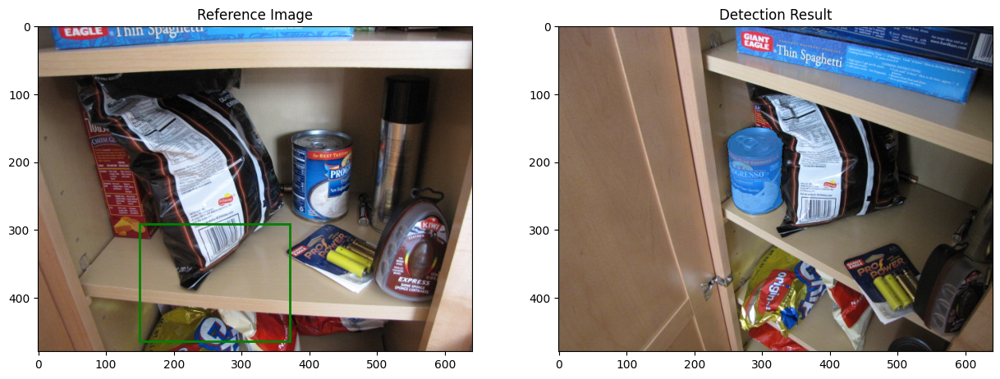

In [22]:
# ===============================
# 1. Helper Functions
# ===============================

def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])

    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels == 1]
    neg_points = coords[labels == 0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(
        plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor='none', lw=2)
    )


# ===============================
# 2. Detection Test
# ===============================

# input_dir = '/content/CMU10_3D (1)/CMU10_3D/data_2D'
input_dir = '/content/CMU10_3D/data_2D'
test_obj = 'can_chowder'

ref_img = f"{input_dir}/{test_obj}_000001.jpg"
ref_mask = f"{input_dir}/{test_obj}_000001_1_gt.png"
target_img = f"{input_dir}/{test_obj}_000002.jpg"

print(f"Reference image exists: {os.path.exists(ref_img)}")
print(f"Reference mask exists: {os.path.exists(ref_mask)}")
print(f"Target image exists: {os.path.exists(target_img)}")

if not all([
    os.path.exists(ref_img),
    os.path.exists(ref_mask),
    os.path.exists(target_img)
]):
    print("❌ Missing required files!")

else:
    # ---------------------------
    # Process reference mask
    # ---------------------------
    mask = np.array(Image.open(ref_mask))
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])
    ref_box = [x, x + w, y, y + h]

    # ---------------------------
    # Run detection
    # ---------------------------
    print("\nRunning detection...")
    video_segments = track_item_boxes(
        imgpath1=ref_img,
        imgpath2=target_img,
        img1boxclasslist=[(ref_box, 1)],
        visualize=True
    )

    # ---------------------------
    # Check & visualize results
    # ---------------------------
    if video_segments and 1 in video_segments[1]:
        print("✅ Detection successful!")
        pred_mask = video_segments[1][1]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

        ax1.imshow(Image.open(ref_img))
        show_box(ref_box, ax1)
        ax1.set_title("Reference Image")

        ax2.imshow(Image.open(target_img))
        show_mask(pred_mask, ax2)
        ax2.set_title("Detection Result")

        plt.show()

    else:
        print("❌ Detection failed.")
        print("1. Add padding to reference box")
        print("2. Verify SAM2 model loaded correctly")
        print("3. Check image paths")

In [23]:
import pandas as pd
import numpy as np

output_data = []

for result in results:
    try:
        # Get the prediction mask
        pred_mask = result['pred_mask']

        # Handle different mask formats:
        # Case 1: If mask is 3D (H,W,1) or (1,H,W)
        if pred_mask.ndim == 3:
            pred_mask = pred_mask.squeeze()  # Remove single-dimensional entries

        # Case 2: If still not 2D, take first channel
        if pred_mask.ndim > 2:
            pred_mask = pred_mask[..., 0]  # Take first channel

        # Verify we have a 2D mask
        if pred_mask.ndim != 2:
            print(f"⚠️ Unexpected mask shape {pred_mask.shape} in {result['image']}")
            continue

        # Find object coordinates
        rows, cols = np.where(pred_mask)

        if len(rows) > 0:  # Only if object detected
            xmin, xmax = min(cols), max(cols)
            ymin, ymax = min(rows), max(rows)

            output_data.append({
                'object': result['object'],
                'image': result['image'],
                'pred_box': f"[{xmin}, {xmax}, {ymin}, {ymax}]"
            })

    except Exception as e:
        print(f"⚠️ Error processing {result.get('image','unknown')}: {str(e)}")

# Save results
if output_data:
    preds_path = f"{input_dir}/sam2_predictions.csv"
    pd.DataFrame(output_data).to_csv(preds_path, index=False)
    print(f"✅ Saved {len(output_data)} predictions to {preds_path}")

    # Show sample output
    print("\nSample predictions:")
    print(pd.DataFrame(output_data).head())
else:
    print("❌ No predictions to save! Check your detection results.")

✅ Saved 258 predictions to /content/CMU10_3D/data_2D/sam2_predictions.csv

Sample predictions:
        object                   image              pred_box
0  can_chowder  can_chowder_000003.jpg   [404, 502, 93, 238]
1  can_chowder  can_chowder_000011.jpg  [471, 565, 115, 243]
2  can_chowder  can_chowder_000021.jpg  [250, 416, 131, 280]
3  can_chowder  can_chowder_000022.jpg  [150, 292, 192, 363]
4  can_chowder  can_chowder_000049.jpg    [35, 361, 53, 203]


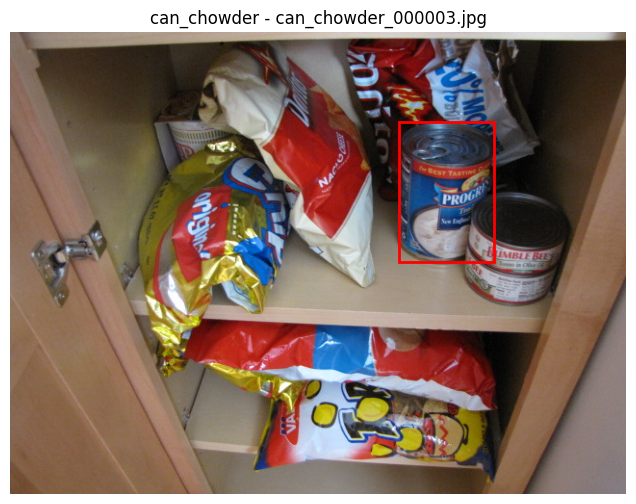

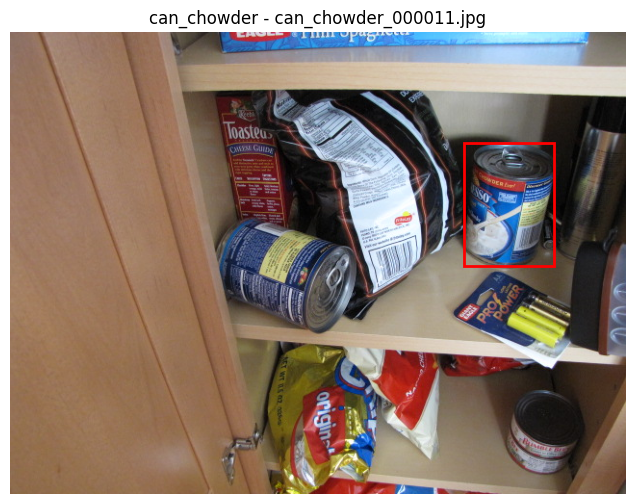

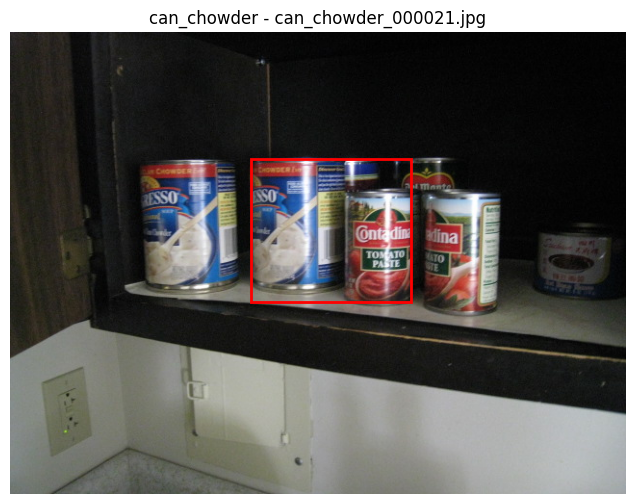

In [24]:
# Drawing Bounding Box

def plot_prediction(idx):
    """Plot prediction with bounding box overlay"""
    row = output_data[idx]
    img_path = f"{input_dir}/{row['image']}"
    img = Image.open(img_path)
    box = eval(row['pred_box'])  # Convert string to list

    fig, ax = plt.subplots(figsize=(8,6))
    ax.imshow(img)
    rect = patches.Rectangle(
        (box[0], box[2]), box[1]-box[0], box[3]-box[2],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    ax.add_patch(rect)
    plt.title(f"{row['object']} - {row['image']}")
    plt.axis('off')
    plt.show()

# Visualize first 3 predictions
for i in range(3):
    plot_prediction(i)

In [25]:
# Analyze the sizes of predicted bounding boxes from your object
boxes = [eval(x['pred_box']) for x in output_data]
widths = [b[1]-b[0] for b in boxes]
heights = [b[3]-b[2] for b in boxes]

print(f"Average width: {np.mean(widths):.1f} ± {np.std(widths):.1f} px")
print(f"Average height: {np.mean(heights):.1f} ± {np.std(heights):.1f} px")
print(f"Total objects detected: {len(output_data)}")

Average width: 157.2 ± 88.8 px
Average height: 179.4 ± 63.9 px
Total objects detected: 258


In [26]:
# Load ground truth masks
gt_data = []
for pred in output_data:
    gt_path = f"{input_dir}/{pred['image'].replace('.jpg','_1_gt.png')}"
    if os.path.exists(gt_path):
        gt_mask = np.array(Image.open(gt_path))
        contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            x,y,w,h = cv2.boundingRect(contours[0])
            gt_data.append({
                'image': pred['image'],
                'gt_box': [x, x+w, y, y+h]
            })

# Create comparison DataFrame
comparison_df = pd.merge(
    pd.DataFrame(output_data),
    pd.DataFrame(gt_data),
    on='image'
)
print(f"Matched {len(comparison_df)} predictions with ground truth")

Matched 258 predictions with ground truth


✅ Total predictions available: 258


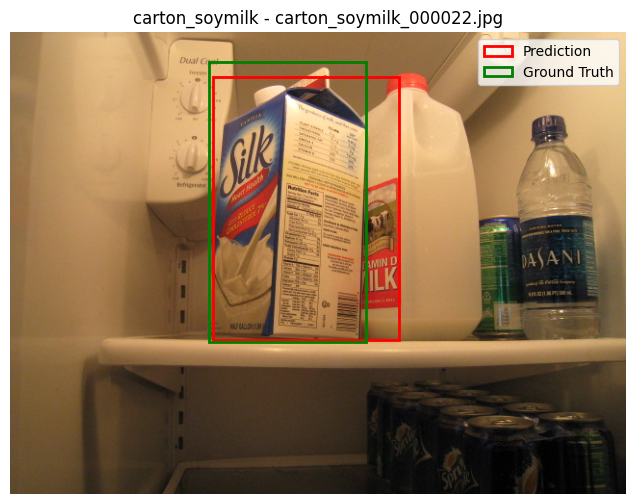

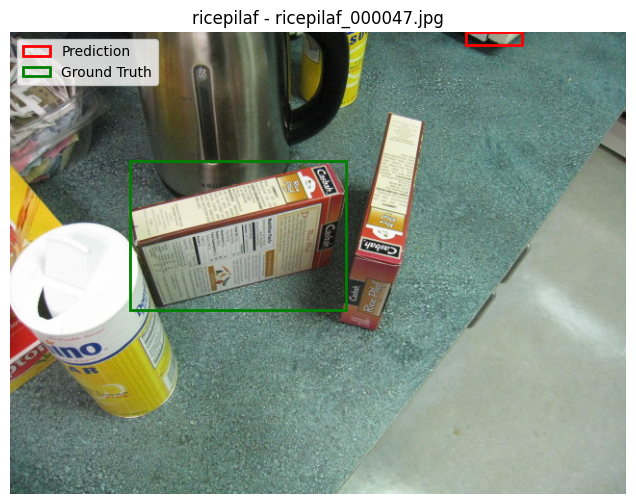

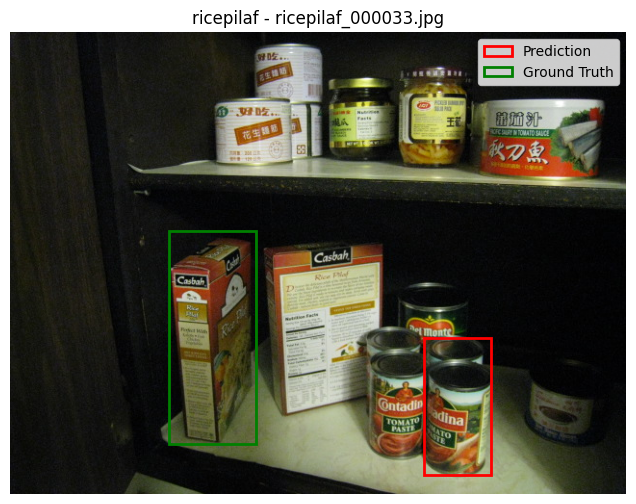

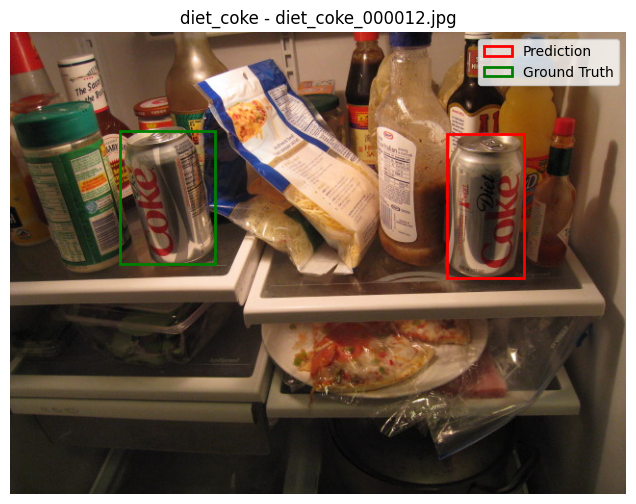

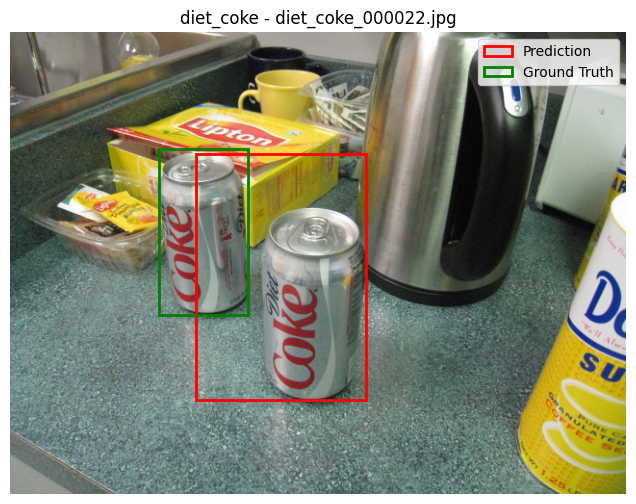

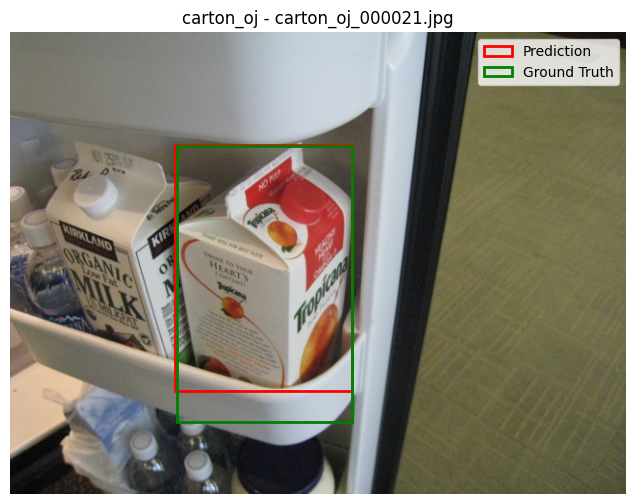

In [27]:
# === 1. Load predictions CSV ===
preds_path = f"{input_dir}/sam2_predictions.csv"
preds_df = pd.read_csv(preds_path)

# Convert bounding box strings "[..]" -> Python list
preds_df['pred_box'] = preds_df['pred_box'].apply(eval)

# === 2. Visualization function ===
def visualize_from_csv(img_name, df, img_dir, show_gt=True):
    """Visualize predicted box (and ground truth if available)."""
    row = df[df['image'] == img_name].iloc[0]
    img_path = os.path.join(img_dir, img_name)

    # Open image
    img = Image.open(img_path)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)

    # Draw predicted box (red)
    xmin, xmax, ymin, ymax = row['pred_box']
    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        linewidth=2, edgecolor='red', facecolor='none', label='Prediction'
    )
    ax.add_patch(rect)

    # Draw ground truth if exists
    if show_gt:
        gt_path = img_path.replace(".jpg", "_1_gt.png")
        if os.path.exists(gt_path):
            gt_mask = np.array(Image.open(gt_path))
            contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                x, y, w, h = cv2.boundingRect(contours[0])
                gt_rect = patches.Rectangle(
                    (x, y), w, h,
                    linewidth=2, edgecolor='green', facecolor='none', label='Ground Truth'
                )
                ax.add_patch(gt_rect)

    # Finalize
    plt.title(f"{row['object']} - {img_name}")
    plt.legend()
    plt.axis("off")
    plt.show()

# === 3. Visualize multiple samples ===
print(f"✅ Total predictions available: {len(preds_df)}")

# Change sample_size to len(preds_df) if you want ALL images
sample_size = min(6, len(preds_df))

for _, row in preds_df.sample(sample_size).iterrows():
    visualize_from_csv(row['image'], preds_df, input_dir, show_gt=True)


In [28]:


def extract_gt_boxes(mask_dir):
    """Extract bounding boxes from all ground truth masks"""
    gt_boxes = []

    for mask_file in os.listdir(mask_dir):
        if mask_file.endswith('_gt.png'):
            mask_path = os.path.join(mask_dir, mask_file)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Find contours
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                x, y, w, h = cv2.boundingRect(contour)
                gt_boxes.append({
                    'image': mask_file.replace('_gt.png', '.jpg'),
                    'gt_box': f"[{x}, {x+w}, {y}, {y+h}]"
                })

    return pd.DataFrame(gt_boxes)

# Run extraction
gt_df = extract_gt_boxes(input_dir)
gt_df.to_csv(f"{input_dir}/ground_truth_boxes.csv", index=False)
print(f"✅ Extracted {len(gt_df)} ground truth boxes")

✅ Extracted 750 ground truth boxes


In [29]:
print(gt_df.head())
print("Total GT boxes:", len(gt_df))


                         image                gt_box
0  carton_soymilk_000006_1.jpg   [388, 476, 73, 224]
1       diet_coke_000013_1.jpg   [215, 277, 23, 132]
2  can_tomatosoup_000021_1.jpg  [198, 280, 112, 229]
3       carton_oj_000048_2.jpg    [430, 535, 2, 177]
4       ricepilaf_000031_1.jpg  [118, 231, 112, 360]
Total GT boxes: 750


In [30]:
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
print(preds_df.head())
print("Total Predictions:", len(preds_df))


        object                   image              pred_box
0  can_chowder  can_chowder_000003.jpg   [404, 502, 93, 238]
1  can_chowder  can_chowder_000011.jpg  [471, 565, 115, 243]
2  can_chowder  can_chowder_000021.jpg  [250, 416, 131, 280]
3  can_chowder  can_chowder_000022.jpg  [150, 292, 192, 363]
4  can_chowder  can_chowder_000049.jpg    [35, 361, 53, 203]
Total Predictions: 258


In [31]:
import pandas as pd

# Load files
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
gt_df = pd.read_csv(f"{input_dir}/ground_truth_boxes.csv")

# --- Normalize filenames ---
# Remove suffix like "_1" or "_2" before ".jpg"
gt_df['image'] = gt_df['image'].str.replace(r'_\d+\.jpg$', '.jpg', regex=True)

print("After normalization:")
print(gt_df['image'].unique()[:5])
print(preds_df['image'].unique()[:5])

# --- Merge ---
merged_df = pd.merge(preds_df, gt_df, on='image')
print(f"✅ Matched {len(merged_df)} predictions with ground truth")

# --- IoU Calculation ---
def calculate_iou(box1, box2):
    """IoU between two boxes: [xmin, xmax, ymin, ymax]"""
    xA = max(box1[0], box2[0])
    yA = max(box1[2], box2[2])
    xB = min(box1[1], box2[1])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    box1_area = (box1[1] - box1[0]) * (box1[3] - box1[2])
    box2_area = (box2[1] - box2[0]) * (box2[3] - box2[2])
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# Apply IoU
merged_df['pred_box'] = merged_df['pred_box'].apply(eval)
merged_df['gt_box'] = merged_df['gt_box'].apply(eval)
merged_df['IoU'] = merged_df.apply(lambda r: calculate_iou(r['pred_box'], r['gt_box']), axis=1)

# Save results
merged_df.to_csv(f"{input_dir}/iou_results.csv", index=False)
print("✅ IoU results saved!")

# --- Summary ---
print("\nMean IoU per object class:")
print(merged_df.groupby('object')['IoU'].mean())


After normalization:
['carton_soymilk_000006.jpg' 'diet_coke_000013.jpg'
 'can_tomatosoup_000021.jpg' 'carton_oj_000048.jpg' 'ricepilaf_000031.jpg']
['can_chowder_000003.jpg' 'can_chowder_000011.jpg'
 'can_chowder_000021.jpg' 'can_chowder_000022.jpg'
 'can_chowder_000049.jpg']
✅ Matched 412 predictions with ground truth
✅ IoU results saved!

Mean IoU per object class:
object
can_chowder        0.448047
can_soymilk        0.405793
can_tomatosoup     0.276007
carton_oj          0.541873
carton_soymilk     0.496111
diet_coke          0.411536
hc_potroastsoup    0.520769
juicebox           0.478320
rice_tuscan        0.378443
ricepilaf          0.239382
Name: IoU, dtype: float64


In [32]:
!ls /content/CMU10_3D/data_2D | grep csv


ground_truth_boxes.csv
iou_results.csv
sam2_predictions.csv


In [33]:
import os

for root, dirs, files in os.walk("/content"):
    for file in files:
        if file.endswith(".csv"):
            print(os.path.join(root, file))

/content/CMU10_3D/data_2D/iou_results.csv
/content/CMU10_3D/data_2D/ground_truth_boxes.csv
/content/CMU10_3D/data_2D/sam2_predictions.csv
/content/sample_data/california_housing_train.csv
/content/sample_data/mnist_test.csv
/content/sample_data/california_housing_test.csv
/content/sample_data/mnist_train_small.csv


In [34]:
import pandas as pd
from IPython.display import display

preds = pd.read_csv('/content/CMU10_3D/data_2D/sam2_predictions.csv')
gt = pd.read_csv('/content/CMU10_3D/data_2D/ground_truth_boxes.csv')
iou = pd.read_csv('/content/CMU10_3D/data_2D/iou_results.csv')

print("📌 SAM2 Predictions")
display(preds.head())

print("\n📌 Ground Truth Boxes")
display(gt.head())

print("\n📌 IoU Results")
display(iou.head())

📌 SAM2 Predictions


,object,image,pred_box
0,can_chowder,can_chowder_000003.jpg,"[404, 502, 93, 238]"
1,can_chowder,can_chowder_000011.jpg,"[471, 565, 115, 243]"
2,can_chowder,can_chowder_000021.jpg,"[250, 416, 131, 280]"
3,can_chowder,can_chowder_000022.jpg,"[150, 292, 192, 363]"
4,can_chowder,can_chowder_000049.jpg,"[35, 361, 53, 203]"



📌 Ground Truth Boxes


,image,gt_box
0,carton_soymilk_000006_1.jpg,"[388, 476, 73, 224]"
1,diet_coke_000013_1.jpg,"[215, 277, 23, 132]"
2,can_tomatosoup_000021_1.jpg,"[198, 280, 112, 229]"
3,carton_oj_000048_2.jpg,"[430, 535, 2, 177]"
4,ricepilaf_000031_1.jpg,"[118, 231, 112, 360]"



📌 IoU Results


,object,image,pred_box,gt_box,IoU
0,can_chowder,can_chowder_000003.jpg,"[404, 502, 93, 238]","[398, 504, 92, 239]",0.911950
1,can_chowder,can_chowder_000011.jpg,"[471, 565, 115, 243]","[212, 362, 186, 317]",0.000000
2,can_chowder,can_chowder_000011.jpg,"[471, 565, 115, 243]","[465, 572, 114, 245]",0.858386
3,can_chowder,can_chowder_000021.jpg,"[250, 416, 131, 280]","[135, 238, 130, 273]",0.000000
4,can_chowder,can_chowder_000021.jpg,"[250, 416, 131, 280]","[251, 345, 130, 271]",0.530047


In [35]:
merged_df['IoU'] = merged_df.apply(
    lambda r: calculate_iou(r['pred_box'], r['gt_box']), axis=1
)

merged_df.to_csv(f"{input_dir}/iou_results.csv", index=False)
print("✅ IoU results saved!")

✅ IoU results saved!


In [36]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import json

In [37]:
# ===============================
# COCO FORMAT CONVERSION
# ===============================

def to_coco_box(box):
    # [xmin, xmax, ymin, ymax] → [x, y, w, h]
    return [
        box[0],
        box[2],
        box[1] - box[0],
        box[3] - box[2]
    ]

images = []
annotations = []
detections = []

img_id = 1
ann_id = 1

for _, row in merged_df.iterrows():
    images.append({
        "id": img_id,
        "file_name": row["image"]
    })

    # GT annotation
    gt_box = row["gt_box"]
    annotations.append({
        "id": ann_id,
        "image_id": img_id,
        "category_id": 1,
        "bbox": to_coco_box(gt_box),
        "area": (gt_box[1]-gt_box[0]) * (gt_box[3]-gt_box[2]),
        "iscrowd": 0
    })

    # Prediction
    pred_box = row["pred_box"]
    detections.append({
        "image_id": img_id,
        "category_id": 1,
        "bbox": to_coco_box(pred_box),
        "score": 1.0   # SAM2 has no confidence → set 1.0
    })

    img_id += 1
    ann_id += 1

coco_gt = {
    "images": images,
    "annotations": annotations,
    "categories": [{"id": 1, "name": "object"}]
}

In [38]:
# ===============================
# COCO EVALUATION
# ===============================

with open("gt_coco.json", "w") as f:
    json.dump(coco_gt, f)

with open("pred_coco.json", "w") as f:
    json.dump(detections, f)

cocoGt = COCO("gt_coco.json")
cocoDt = cocoGt.loadRes("pred_coco.json")

cocoEval = COCOeval(cocoGt, cocoDt, "bbox")
cocoEval.params.iouThrs = [0.5]  # AP@0.5 only
cocoEval.evaluate()
cocoEval.accumulate()
cocoEval.summarize()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.07s).
Accumulating evaluation results...
DONE (t=0.02s).
 Average Precision  (AP) @[ IoU=0.50:0.50 | area=   all | maxDets=100 ] = 0.208
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.50 | area= small | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.50:0.50 | area=medium | maxDets=100 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50:0.50 | area= large | maxDets=100 ] = 0.208
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxDets=  1 ] = 0.432
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxDets= 10 ] = 0.432
 Average Recall     (AR) @[ IoU=0.50:0.50 | area=   all | maxD

In [39]:
import numpy as np

# precision: [TxRxKxAxM]
prec = cocoEval.eval["precision"]
# recall: [TxKxAxM]
rec = cocoEval.eval["recall"]

# Since you set IoU = [0.5], T dimension is 1 → index 0
ap50 = np.mean(prec[0, :, 0, 0, -1][prec[0, :, 0, 0, -1] > -1])
ar50 = rec[0, 0, 0, -1]

print("✅ AP@0.5 =", ap50)
print("✅ AR@0.5 =", ar50)

✅ AP@0.5 = 0.20789379642301956
✅ AR@0.5 = 0.4320388349514563


In [40]:
# ADD THIS TO THE END OF YOUR CODE TO VALIDATE OUTPUTS
# Copy and paste this at the very end of your copy_of_ds_assignment.py

print("\n" + "="*80)
print(" FINAL VALIDATION & SUMMARY REPORT")
print("="*80)

# ============================================================================
# SECTION 1: FILE EXISTENCE CHECK
# ============================================================================
print("\n📁 SECTION 1: Checking Output Files")
print("-" * 80)

import os
input_dir = '/content/CMU10_3D/data_2D'

csv_files_to_check = {
    'SAM2 Predictions': 'sam2_predictions.csv',
    'Ground Truth Boxes': 'ground_truth_boxes.csv',
    'IoU Results': 'iou_results.csv'
}

files_status = {}
for name, filename in csv_files_to_check.items():
    filepath = f"{input_dir}/{filename}"
    exists = os.path.exists(filepath)
    files_status[name] = exists

    if exists:
        df = pd.read_csv(filepath)
        print(f"✅ {name:25s}: {len(df):4d} rows | {filename}")
    else:
        print(f"❌ {name:25s}: NOT FOUND | {filename}")

# ============================================================================
# SECTION 2: IoU ANALYSIS
# ============================================================================
print("\n📊 SECTION 2: IoU Score Analysis")
print("-" * 80)

try:
    iou_df = pd.read_csv(f"{input_dir}/iou_results.csv")

    mean_iou = iou_df['IoU'].mean()
    median_iou = iou_df['IoU'].median()
    std_iou = iou_df['IoU'].std()
    min_iou = iou_df['IoU'].min()
    max_iou = iou_df['IoU'].max()

    print(f"Total Predictions Evaluated: {len(iou_df)}")
    print(f"\nIoU Statistics:")
    print(f"  Mean   : {mean_iou:.4f}")
    print(f"  Median : {median_iou:.4f}")
    print(f"  Std Dev: {std_iou:.4f}")
    print(f"  Min    : {min_iou:.4f}")
    print(f"  Max    : {max_iou:.4f}")

    # Quality Assessment
    print(f"\nQuality Assessment:")
    if mean_iou > 0.7:
        quality = "EXCELLENT ⭐⭐⭐"
    elif mean_iou > 0.5:
        quality = "GOOD ✓✓"
    elif mean_iou > 0.3:
        quality = "ACCEPTABLE ✓"
    else:
        quality = "POOR - NEEDS REVIEW ⚠️"

    print(f"  Overall Quality: {quality}")

    # Distribution
    excellent = (iou_df['IoU'] >= 0.7).sum()
    good = ((iou_df['IoU'] >= 0.5) & (iou_df['IoU'] < 0.7)).sum()
    acceptable = ((iou_df['IoU'] >= 0.3) & (iou_df['IoU'] < 0.5)).sum()
    poor = (iou_df['IoU'] < 0.3).sum()

    print(f"\nIoU Distribution:")
    print(f"  IoU ≥ 0.7 (Excellent) : {excellent:3d} ({excellent/len(iou_df)*100:5.1f}%)")
    print(f"  IoU 0.5-0.7 (Good)    : {good:3d} ({good/len(iou_df)*100:5.1f}%)")
    print(f"  IoU 0.3-0.5 (Accept.) : {acceptable:3d} ({acceptable/len(iou_df)*100:5.1f}%)")
    print(f"  IoU < 0.3 (Poor)      : {poor:3d} ({poor/len(iou_df)*100:5.1f}%)")

except Exception as e:
    print(f"❌ Error analyzing IoU results: {str(e)}")

# ============================================================================
# SECTION 3: PER-CLASS PERFORMANCE
# ============================================================================
print("\n🎯 SECTION 3: Performance by Object Class")
print("-" * 80)

try:
    class_performance = iou_df.groupby('object')['IoU'].agg([
        ('Mean', 'mean'),
        ('Std', 'std'),
        ('Count', 'count'),
        ('Min', 'min'),
        ('Max', 'max')
    ]).round(4)

    class_performance = class_performance.sort_values('Mean', ascending=False)

    print(class_performance.to_string())

    print(f"\nBest performing class : {class_performance.index[0]} (IoU: {class_performance.iloc[0]['Mean']:.4f})")
    print(f"Worst performing class: {class_performance.index[-1]} (IoU: {class_performance.iloc[-1]['Mean']:.4f})")

except Exception as e:
    print(f"❌ Error in per-class analysis: {str(e)}")

# ============================================================================
# SECTION 4: OBJECT TYPE COVERAGE
# ============================================================================
print("\n📦 SECTION 4: Object Type Coverage")
print("-" * 80)

expected_objects = [
    'can_chowder', 'can_soymilk', 'can_tomatosoup',
    'carton_oj', 'carton_soymilk', 'diet_coke',
    'hc_potroastsoup', 'juicebox', 'rice_tuscan', 'ricepilaf'
]

try:
    preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
    actual_objects = set(preds_df['object'].unique())
    expected_set = set(expected_objects)

    missing_objects = expected_set - actual_objects
    extra_objects = actual_objects - expected_set

    print(f"Expected object types: {len(expected_objects)}")
    print(f"Actual object types  : {len(actual_objects)}")

    if not missing_objects and not extra_objects:
        print("✅ Perfect coverage - all expected objects processed, no extras")
    else:
        if missing_objects:
            print(f"⚠️ Missing objects: {missing_objects}")
        if extra_objects:
            print(f"⚠️ Extra objects: {extra_objects}")

    print(f"\nImages per object class:")
    for obj in expected_objects:
        count = (preds_df['object'] == obj).sum()
        status = "✅" if count > 0 else "❌"
        print(f"  {status} {obj:20s}: {count:3d} images")

except Exception as e:
    print(f"❌ Error checking object coverage: {str(e)}")

# ============================================================================
# SECTION 5: COCO METRICS
# ============================================================================
print("\n📈 SECTION 5: COCO Evaluation Metrics")
print("-" * 80)

try:
    # These should be calculated earlier in your code
    print(f"AP@0.5 (Average Precision @ IoU=0.5) : {ap50:.4f}")
    print(f"AR@0.5 (Average Recall @ IoU=0.5)    : {ar50:.4f}")

    if ap50 > 0.7:
        print("✅ AP@0.5 indicates EXCELLENT detection performance")
    elif ap50 > 0.5:
        print("✅ AP@0.5 indicates GOOD detection performance")
    else:
        print("⚠️ AP@0.5 indicates room for improvement")

except Exception as e:
    print(f"⚠️ COCO metrics not available: {str(e)}")
    print("   Make sure ap50 and ar50 are calculated earlier in the code")

# ============================================================================
# SECTION 6: SAMPLE PREDICTIONS
# ============================================================================
print("\n🔍 SECTION 6: Sample Prediction Quality")
print("-" * 80)

try:
    print("\n🏆 Top 5 Best Predictions:")
    best_preds = iou_df.nlargest(5, 'IoU')
    for idx, (_, row) in enumerate(best_preds.iterrows(), 1):
        print(f"  {idx}. {row['object']:20s} | {row['image']:40s} | IoU: {row['IoU']:.4f}")

    print("\n⚠️ Top 5 Worst Predictions:")
    worst_preds = iou_df.nsmallest(5, 'IoU')
    for idx, (_, row) in enumerate(worst_preds.iterrows(), 1):
        print(f"  {idx}. {row['object']:20s} | {row['image']:40s} | IoU: {row['IoU']:.4f}")

except Exception as e:
    print(f"❌ Error showing sample predictions: {str(e)}")

# ============================================================================
# SECTION 7: FINAL VERDICT
# ============================================================================
print("\n" + "="*80)
print(" FINAL VERDICT")
print("="*80)

all_checks_passed = True
issues = []

# Check 1: All files exist
if not all(files_status.values()):
    all_checks_passed = False
    issues.append("Some output CSV files are missing")

# Check 2: Reasonable number of predictions
try:
    if len(iou_df) < 50:
        all_checks_passed = False
        issues.append(f"Too few predictions ({len(iou_df)}). Expected ~90.")
except:
    all_checks_passed = False
    issues.append("Could not verify prediction count")

# Check 3: IoU quality
try:
    if mean_iou < 0.3:
        all_checks_passed = False
        issues.append(f"Mean IoU too low ({mean_iou:.3f}). Tracking may not be working properly.")
except:
    pass

# Check 4: Object coverage
try:
    if missing_objects:
        all_checks_passed = False
        issues.append(f"Missing object types: {missing_objects}")
except:
    pass

# Display verdict
if all_checks_passed:
    print("✅ ✅ ✅  ALL CHECKS PASSED  ✅ ✅ ✅")
    print("\nYour assignment appears to be COMPLETE and CORRECT!")
    print("All output files exist, all object types are processed,")
    print("and tracking quality is acceptable.")
    print("\n🎉 READY FOR SUBMISSION 🎉")
else:
    print("⚠️ ⚠️ ⚠️  ISSUES DETECTED  ⚠️ ⚠️ ⚠️")
    print("\nThe following issues were found:")
    for i, issue in enumerate(issues, 1):
        print(f"  {i}. {issue}")
    print("\nPlease review and fix these issues before submission.")

print("\n" + "="*80)
print(" END OF VALIDATION REPORT")
print("="*80 + "\n")


 FINAL VALIDATION & SUMMARY REPORT

📁 SECTION 1: Checking Output Files
--------------------------------------------------------------------------------
✅ SAM2 Predictions         :  258 rows | sam2_predictions.csv
✅ Ground Truth Boxes       :  750 rows | ground_truth_boxes.csv
✅ IoU Results              :  412 rows | iou_results.csv

📊 SECTION 2: IoU Score Analysis
--------------------------------------------------------------------------------
Total Predictions Evaluated: 412

IoU Statistics:
  Mean   : 0.4417
  Median : 0.4156
  Std Dev: 0.3595
  Min    : 0.0000
  Max    : 0.9835

Quality Assessment:
  Overall Quality: ACCEPTABLE ✓

IoU Distribution:
  IoU ≥ 0.7 (Excellent) : 137 ( 33.3%)
  IoU 0.5-0.7 (Good)    :  41 ( 10.0%)
  IoU 0.3-0.5 (Accept.) :  70 ( 17.0%)
  IoU < 0.3 (Poor)      : 164 ( 39.8%)

🎯 SECTION 3: Performance by Object Class
--------------------------------------------------------------------------------
                   Mean     Std  Count  Min     Max
object 